In [28]:
import matplotlib.pyplot as plt
import colorsys
from PIL import Image
import numpy as np
from os import listdir
from os.path import isfile, join

In [29]:
def plotMasks(img, masks):
    img = Image.fromarray(img)
    imgGray = img.convert('L')
    imgGrayarray = np.asarray(imgGray)
    rgb = mask_overlay(imgGrayarray, masks, colors=None)
    fig, ax = plt.subplots(figsize=(36,15))
    ax.imshow(rgb)
    plt.savefig('/Users/jones/Downloads/segmentationPic_P9_Aorta6_whiteBackground2.png')

def mask_overlay(img, masks, colors=None):

    img = img.astype(np.float32)

    HSV = np.zeros((img.shape[0], img.shape[1], 3), np.float32)
    HSV[:,:,2] = np.clip((img / 255. if img.max() > 1 else img) * 1.5, 0, 1)
    hues = np.linspace(0, 1, masks.max()+1)[np.random.permutation(masks.max())]
    for n in range(int(masks.max())):
        ipix = (masks==n+1).nonzero()
        if colors is None:
            HSV[ipix[0],ipix[1],0] = hues[n]
        else:
            HSV[ipix[0],ipix[1],0] = colors[n,0]
        HSV[ipix[0],ipix[1],1] = 1.0
    RGB = (hsv_to_rgb(HSV) * 255).astype(np.uint8)
    return RGB


def hsv_to_rgb(arr):
    hsv_to_rgb_channels = np.vectorize(colorsys.hsv_to_rgb)
    h, s, v = np.rollaxis(arr, axis=-1)
    r, g, b = hsv_to_rgb_channels(h, s, v)
    rgb = np.stack((r,g,b), axis=-1)
    return rgb

In [8]:
data = np.load('/Users/jones/Downloads/P9/Aorta6/nuclei/Cropped_IMG-5_seg.npy', allow_pickle=True).item()

In [37]:

import os
path = '/Users/jones/Downloads/aorta1 3'
files = [f for f in listdir(path) if isfile(join(path,f))]

/var/folders/6r/4p5g0w_j4jv11sr24nv1b0140000gn/T/ipykernel_24115/3045298330.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(36,15))


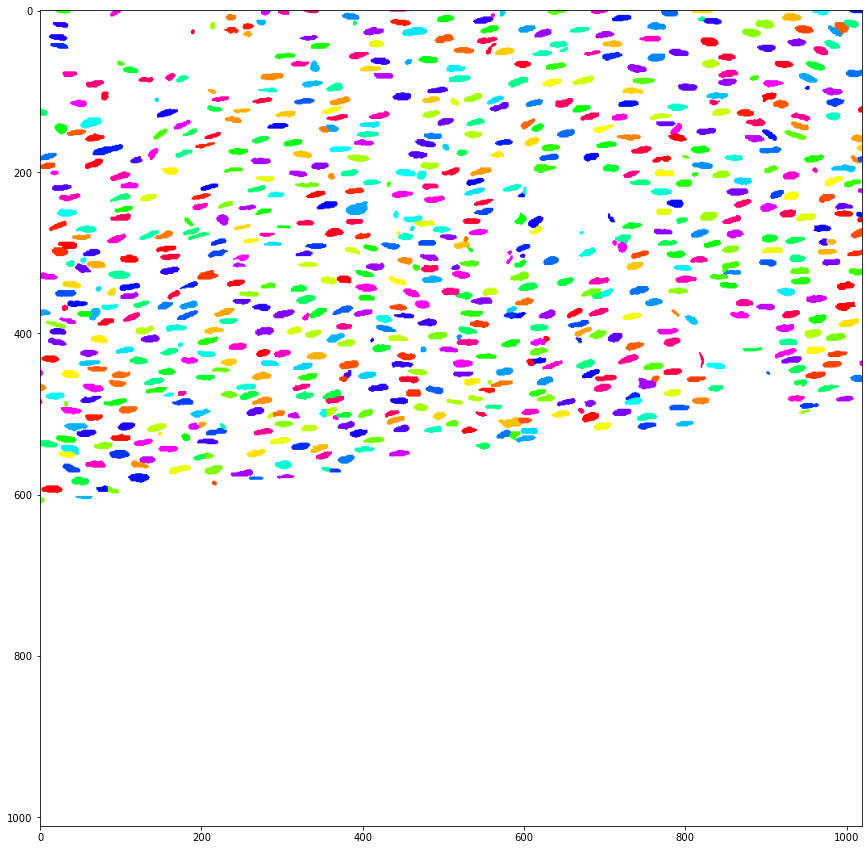

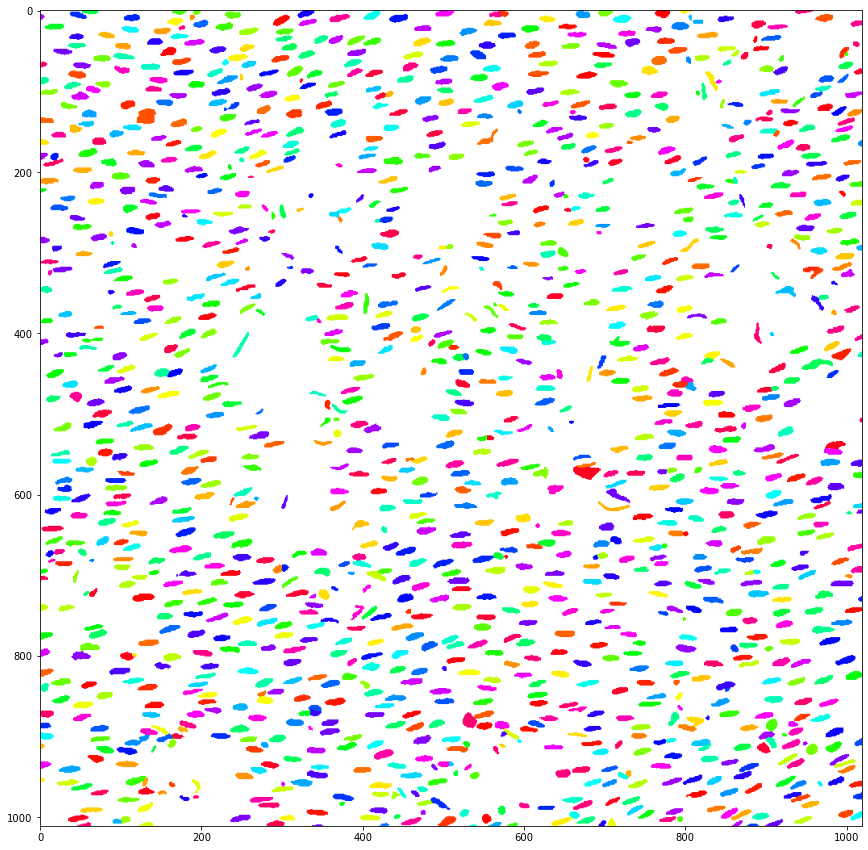

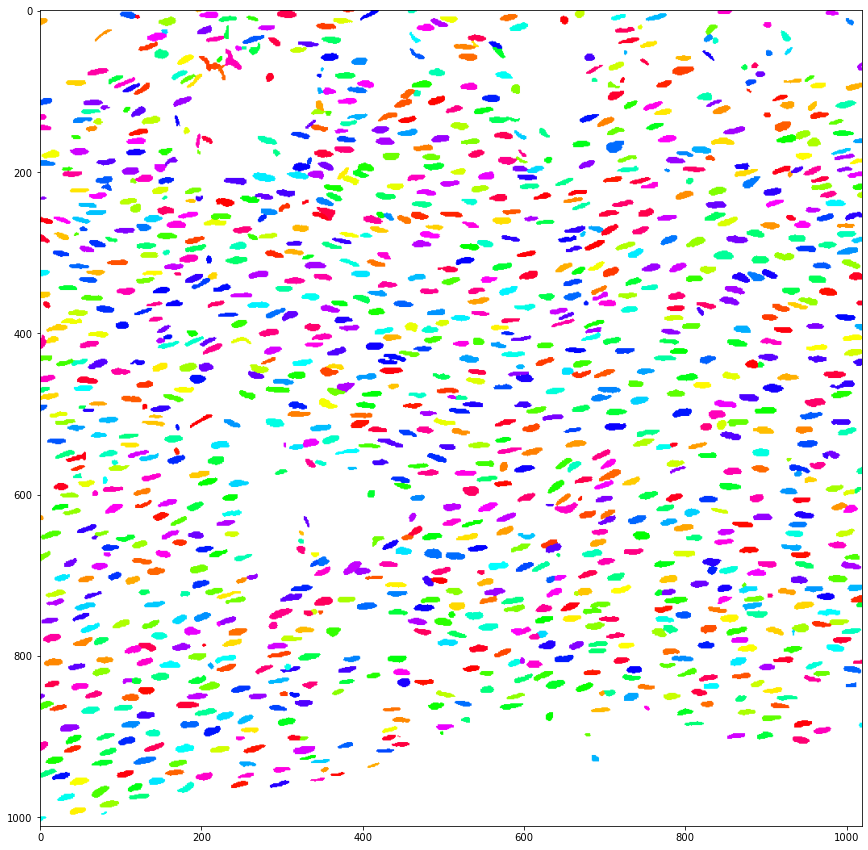

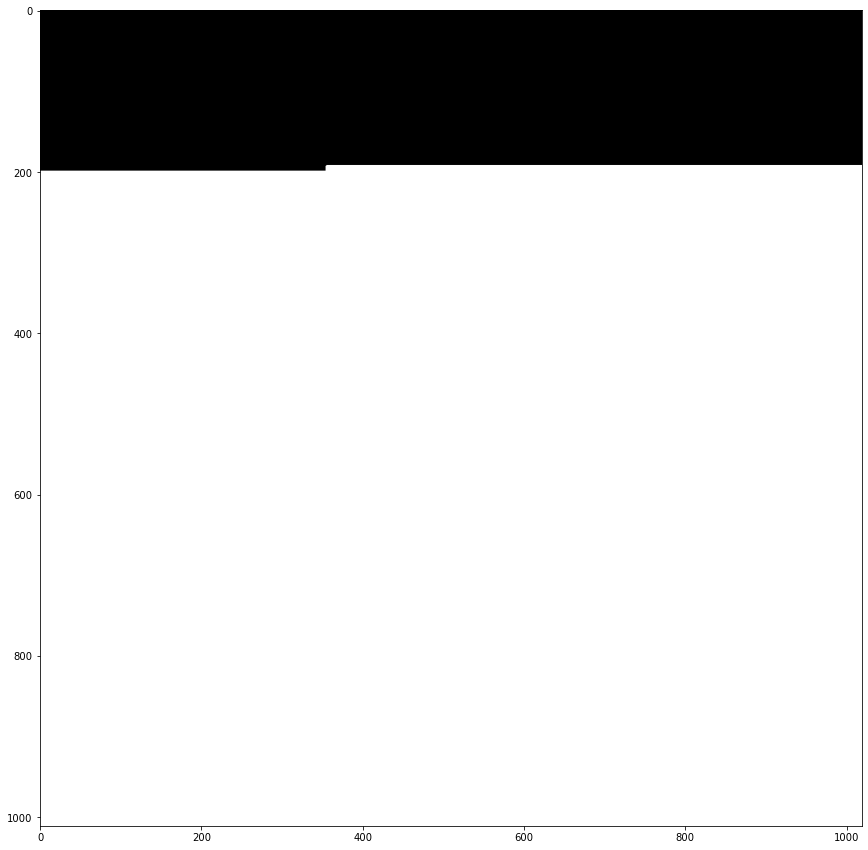

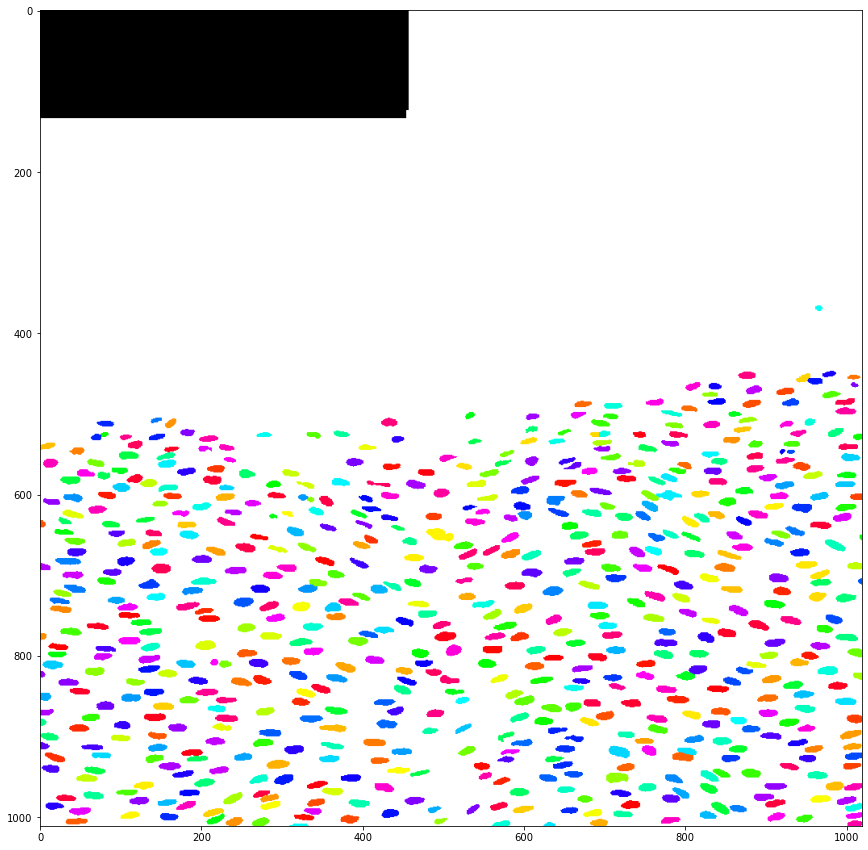

...

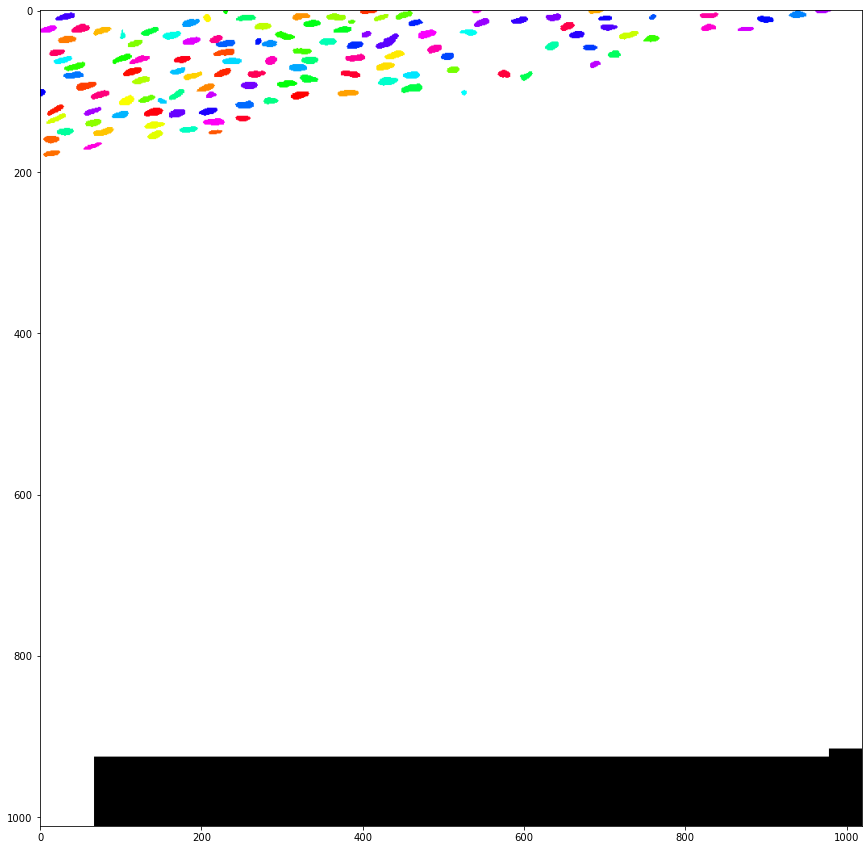

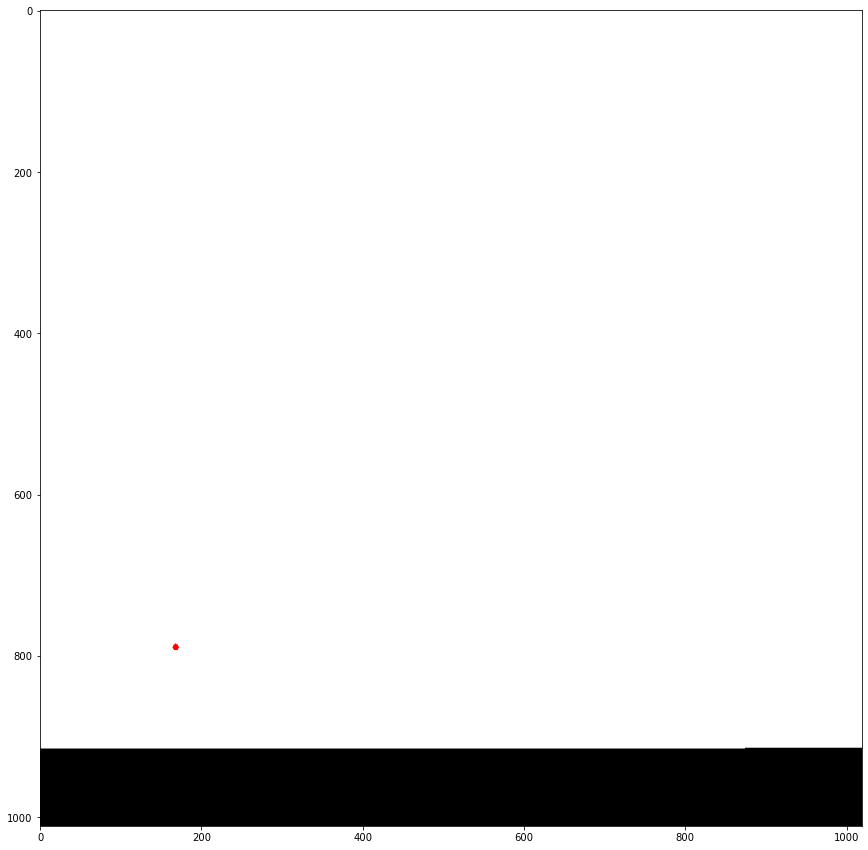

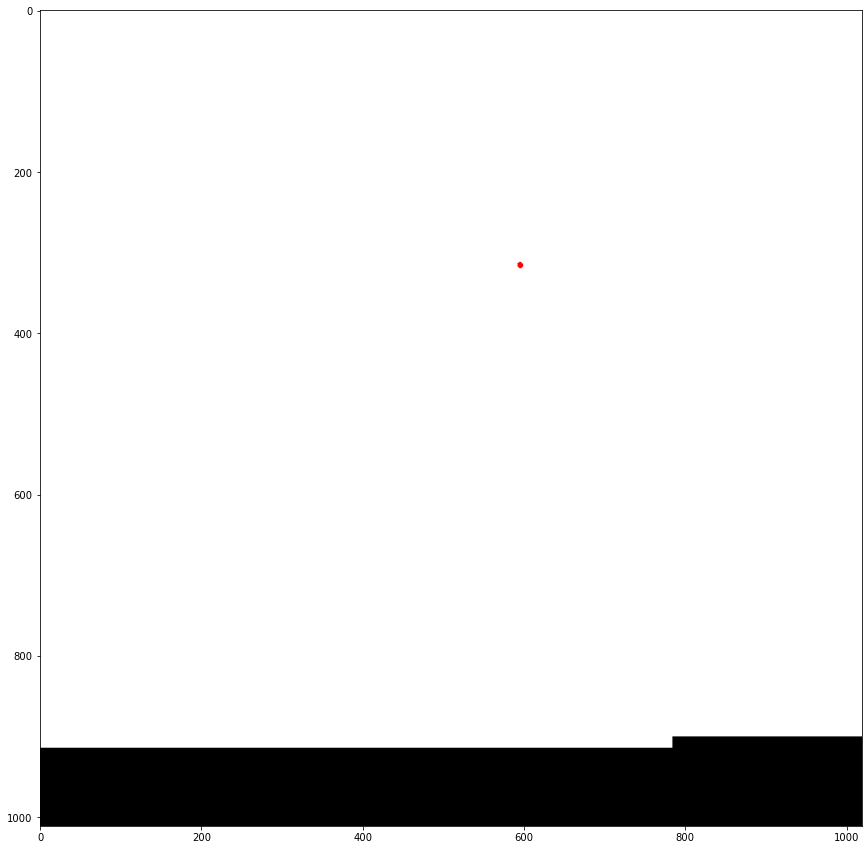

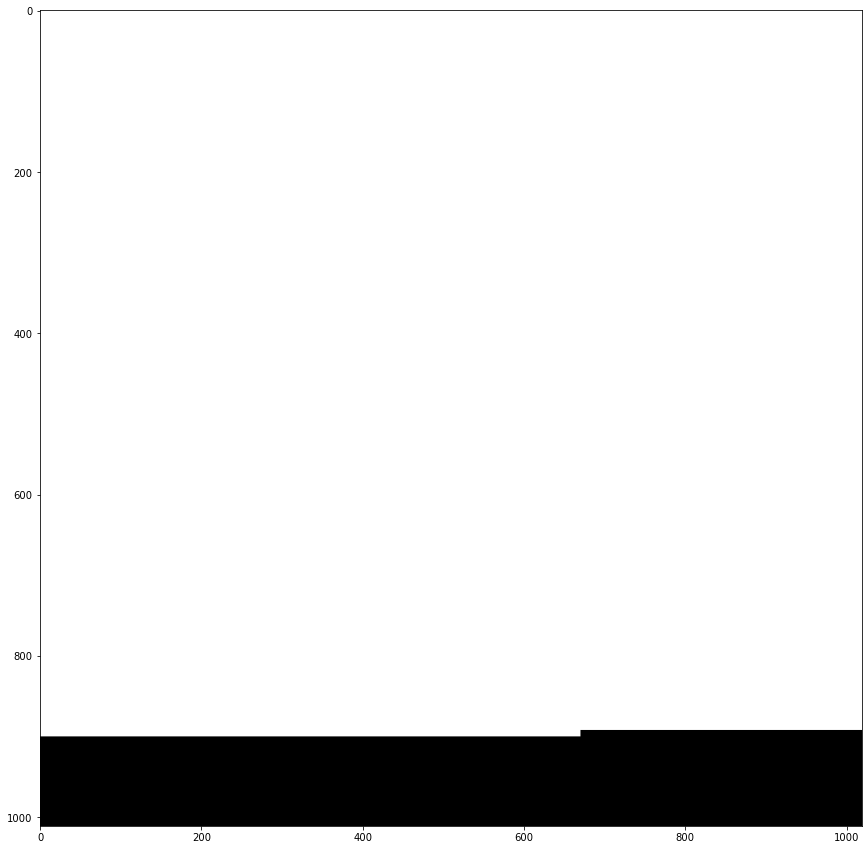

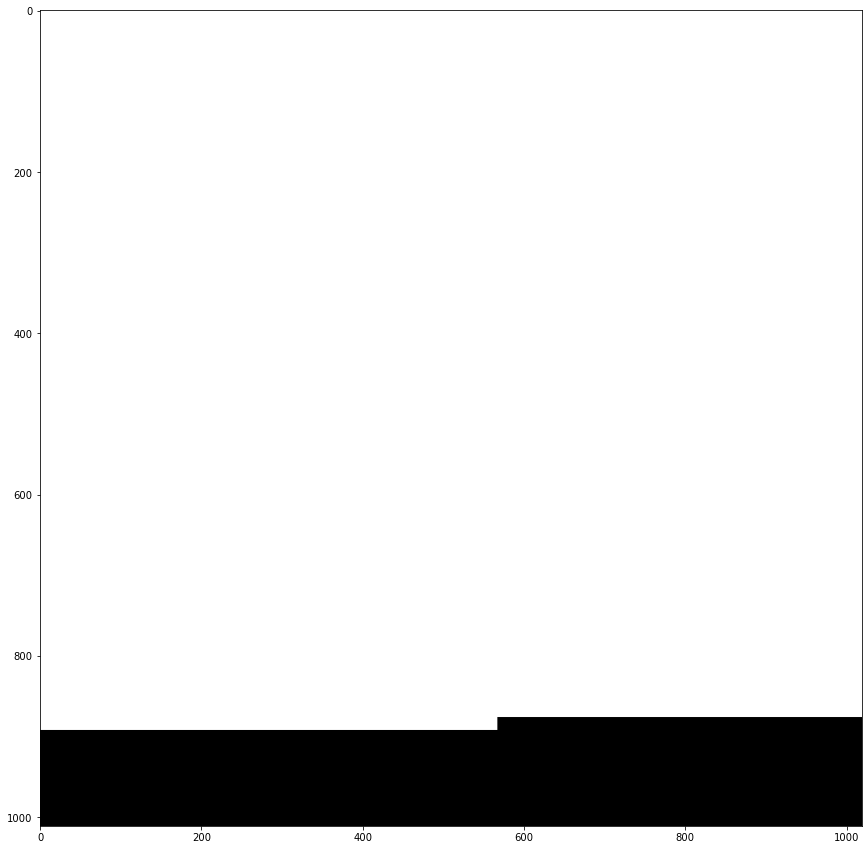

In [39]:
import fnmatch
for i in range(len(files)):
    pattern = "*" + str(i+1) + "_seg.npy"
    filesPattern = fnmatch.filter(files, pattern)
    data = np.load(join(path, filesPattern[0]), allow_pickle=True).item()
    img = data['img']
    masks = data['masks']
    img = Image.fromarray(img)
    imgGray = img.convert('L')
    imgGrayarray = np.asarray(imgGray)
    rgb = mask_overlay(imgGrayarray, masks, colors=None)
    filename = '/Users/jones/Downloads/segmentationPic_P14_Aorta1_whiteBackground_' + str(i+1) + '.png'
    fig, ax = plt.subplots(figsize=(36,15))
    ax.imshow(rgb)
    plt.savefig(filename)

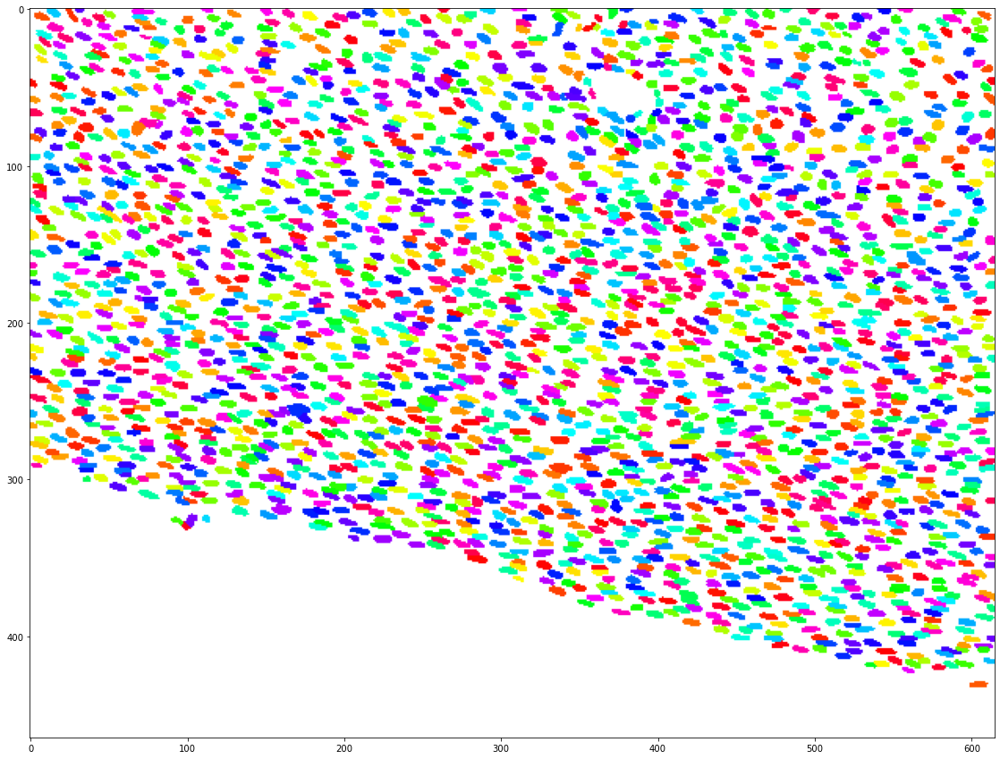

In [24]:
plotMasks(data['img'], data['masks'])